# Algerian Forest Fires


<b>Attribute Information:</b>

 - Date : (DD/MM/YYYY) Day, 
 - month ('june' to 'september'), 
 - year (2012)

<b>Weather data observations</b>

 - Temp : temperature noon (temperature max) in Celsius degrees: 22 to 42
 - RH : Relative Humidity in %: 21 to 90
 - Ws :Wind speed in km/h: 6 to 29
 - Rain: total day in mm: 0 to 16.8

<b>FWI Components</b>
 
 - Fine Fuel Moisture Code (FFMC) index from the FWI system: 28.6 to 92.5
 - Duff Moisture Code (DMC) index from the FWI system: 1.1 to 65.9
 - Drought Code (DC) index from the FWI system: 7 to 220.4
 - Initial Spread Index (ISI) index from the FWI system: 0 to 18.5
 - Buildup Index (BUI) index from the FWI system: 1.1 to 68
 - Fire Weather Index (FWI) Index: 0 to 31.1
 - Classes: two classes, namely not Fire and not Fire
    

## Import Libraries

In [204]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
%matplotlib inline
from pandas_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC

from sklearn.metrics import classification_report

## Import Dataset

In [49]:
forest_fires = pd.read_csv("Algerian_forest_fires_dataset_UPDATE.csv")

In [50]:
forest_fires.head()

,,,,,,,,,,,,,Bejaia Region Dataset
day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire


> Clearing the header part

In [51]:
df= pd.read_csv("Algerian_forest_fires_dataset_UPDATE.csv",header=[1])

In [52]:
df.head()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire


## Exploratory Data Analysis

> <b>Dataset columns</b>

In [53]:
df.columns

Index(['day', 'month', 'year', 'Temperature', ' RH', ' Ws', 'Rain ', 'FFMC',
       'DMC', 'DC', 'ISI', 'BUI', 'FWI', 'Classes  '],
      dtype='object')

> <b> Remove whitespaces from the dataset columns and view them<b>

In [54]:
df.columns = df.columns.str.strip()
df.columns

Index(['day', 'month', 'year', 'Temperature', 'RH', 'Ws', 'Rain', 'FFMC',
       'DMC', 'DC', 'ISI', 'BUI', 'FWI', 'Classes'],
      dtype='object')

> <b> View top 5 rows from dataset</b>

In [55]:
df.head()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
0,01,06,2012,29,57,18,0,65.7,3.4,7.6,1.3,3.4,0.5,not fire
1,02,06,2012,29,61,13,1.3,64.4,4.1,7.6,1,3.9,0.4,not fire
2,03,06,2012,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,not fire
3,04,06,2012,25,89,13,2.5,28.6,1.3,6.9,0,1.7,0,not fire
4,05,06,2012,27,77,16,0,64.8,3,14.2,1.2,3.9,0.5,not fire


> <b>Statistical description of dataset</b>

In [56]:
df.describe()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
count,246,245,245,245,245,245,245,245,245,245,245,245,245,244
unique,33,5,2,20,63,19,40,174,167,199,107,175,128,9
top,26,07,2012,35,64,14,0,88.9,7.9,8,1.1,3,0.4,fire
freq,8,62,244,29,10,43,133,8,5,5,8,5,12,131


<b> From this description it is clear that it contains some non nummeric values
> Detailed information about the dataset</b>

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246 entries, 0 to 245
Data columns (total 14 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   day          246 non-null    object
 1   month        245 non-null    object
 2   year         245 non-null    object
 3   Temperature  245 non-null    object
 4   RH           245 non-null    object
 5   Ws           245 non-null    object
 6   Rain         245 non-null    object
 7   FFMC         245 non-null    object
 8   DMC          245 non-null    object
 9   DC           245 non-null    object
 10  ISI          245 non-null    object
 11  BUI          245 non-null    object
 12  FWI          245 non-null    object
 13  Classes      244 non-null    object
dtypes: object(14)
memory usage: 27.0+ KB


> <b> Dimension and number of rows and columns of dataset<b>

In [58]:
print(f'Dimension of dataframe = {df.ndim}')
print(f'(Rows,columns) = { df.shape}')

Dimension of dataframe = 2
(Rows,columns) = (246, 14)


> <b> Finding Missing values <b>

In [59]:
# Finding Column wise null values ; sum and percentage of missing values

data = {
  "missing_sum": df.isnull().sum(),
  "missing_percentage(%)": (df.isnull().sum() * 100)/len(df)
}

pd.DataFrame(data)

,missing_sum,missing_percentage(%)
day,0,0.000000
month,1,0.406504
year,1,0.406504
Temperature,1,0.406504
RH,1,0.406504
Ws,1,0.406504
Rain,1,0.406504
FFMC,1,0.406504
DMC,1,0.406504
DC,1,0.406504


>  Every column except day and classes have one missing value check whether this is in single row. For that check row wise null value

In [60]:
# Finding row wise null values
df[df.isnull().sum(axis=1) >0]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes
122,Sidi-Bel Abbes Region Dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
167,14,07,2012,37,37,18,0.2,88.9,12.9,14.6 9,12.5,10.4,fire,NaN


> From above data it is clear that from index <b>0 to 121</b>,the data is related to <b>Bejaia Region</b> and from index <b>122</b> ,data is related to <b>Sidi-Bel Abbes Region</b> ; so for partitioning this another column is added named <b>Region</b> and for <b>Bejaia Region</b> is labelled as <b>1</b> and for  <b>Sidi-Bel Abbes Region</b> is labelled as <b>2</b>. Then deleting 122nd row since all other values are null.<br><br>
>Coming to <b>167</b>th row, it is also clearly visible that from <b>DC</b> the values are misplaced. so shift the values to right. So that the row also get cleared

In [61]:
df.loc[:122,'Region'] = 1  # 1 - Bejaia Region
df.loc[122:,'Region'] = 2  # 2 - Sidi-Bel Abbes Region

In [62]:
# the all elements in the row index with 122 is null ; so deleting that row
df.drop(122, inplace = True)

In [63]:
# DC value have white space ; splitting it
DC_split = df.iloc[166]['DC'].split(' ')
df.loc[167,'DC']=DC_split[0]


In [64]:
# saving current ISI value to a varibale 'ISI_val' to move to next attribute
ISI_val = df.loc[167,'ISI']
# second part of splitted DC value is moved to ISI
df.loc[167,'ISI'] = DC_split[1]

In [65]:
# saving current BUI value to a varibale 'BUI_val' to move to next attribute
BUI_val = df.loc[167,'BUI']
# ISI_val is moving to BUI
df.loc[167,'BUI'] = ISI_val

In [66]:
# saving current FWI value to a varibale 'FWI_val' to move to next attribute
FWI_val = df.loc[167,'FWI']
# BUI_val is moving to FWI
df.loc[167,'FWI']= BUI_val

In [67]:
# FWI_val is moving to next attribute 'Classes'
df.loc[167,'Classes']= FWI_val

> Rechecking the same row

In [68]:
df.iloc[[166]]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
167,14,07,2012,37,37,18,0.2,88.9,12.9,14.6,9,12.5,10.4,fire,2.0


> <b> Checking Missing values</b>

In [69]:
# Finding Column wise null values ; sum and percentage of missing values

data = {
  "missing_sum": df.isnull().sum(),
  "missing_percentage(%)": (df.isnull().sum() * 100)/len(df)
}

pd.DataFrame(data)

,missing_sum,missing_percentage(%)
day,0,0.0
month,0,0.0
year,0,0.0
Temperature,0,0.0
RH,0,0.0
Ws,0,0.0
Rain,0,0.0
FFMC,0,0.0
DMC,0,0.0
DC,0,0.0


> No null values in the dataset

><b> Unique values</b>

In [64]:
df.nunique()

day             32
month            5
year             2
Temperature     20
RH              63
Ws              19
Rain            40
FFMC           174
DMC            167
DC             199
ISI            107
BUI            174
FWI            128
Classes          9
Region           2
dtype: int64

In [70]:
# Printing the unique values
for feature in df.columns:
    if len(df[feature].unique())<=10:
        print(f'Unique values of "{feature}" = {df[feature].unique()}')

Unique values of "month" = ['06' '07' '08' '09' 'month']
Unique values of "year" = ['2012' 'year']
Unique values of "Classes" = ['not fire   ' 'fire   ' 'fire' 'fire ' 'not fire' 'not fire ' 'Classes  '
 'not fire     ' 'not fire    ']
Unique values of "Region" = [1. 2.]


> From above values,<br>
    &emsp;&emsp;- In "month" there is a 'month' value<br>
    &emsp;&emsp;- In "year" also there is a 'year' value<br>
    &emsp;&emsp;- In "Classes" lot of whitespaces, so remove it
    

In [71]:
# Checking the row containing 'month value'
df[df.month.str.contains('month')]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region
123,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,2.0


In [72]:
# Dropping this row
# invalid data in the row number 123; so delete the row
df.drop(123, inplace = True)

In [73]:
# Removing whitespaces from the classes
df['Classes'] = df.Classes.str.strip()

In [74]:
# Rechecking the unique values
for feature in df.columns:
    if len(df[feature].unique())<=10:
        print(f'Unique values of "{feature}" = {df[feature].unique()}')

Unique values of "month" = ['06' '07' '08' '09']
Unique values of "year" = ['2012']
Unique values of "Classes" = ['not fire' 'fire']
Unique values of "Region" = [1. 2.]


> <b> Working on Datatypes</b>

In [75]:
df.dtypes

day             object
month           object
year            object
Temperature     object
RH              object
Ws              object
Rain            object
FFMC            object
DMC             object
DC              object
ISI             object
BUI             object
FWI             object
Classes         object
Region         float64
dtype: object

In [76]:
df = df.astype({'day': np.int32, 'month': np.int32,'year' : np.int32,
                'Temperature' : np.int32, 'RH' : np.int32, 'Ws' : np.int32,
                'Region' : np.int32
               })


In [77]:
for feature in df.columns[6:-2]:
    df = df.astype({feature: np.float64})

In [78]:
# Rechecking datatypes
df.dtypes

day              int32
month            int32
year             int32
Temperature      int32
RH               int32
Ws               int32
Rain           float64
FFMC           float64
DMC            float64
DC             float64
ISI            float64
BUI            float64
FWI            float64
Classes         object
Region           int32
dtype: object

> <b> Checking for Duplicated Row

In [79]:
df[df.duplicated()]

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Classes,Region


> No duplicated rows found

> <b> Month number to month name for better visualization</b>

In [80]:
month_labels = {6: 'June', 7: 'July', 8: 'August',9: 'September'}
df['Months'] = df['month'].apply(lambda x: month_labels[x])
df['Months'].head()

0    June
1    June
2    June
3    June
4    June
Name: Months, dtype: object

> <b> Creating class column with fire = 1 and not fire = 0</b>

In [81]:
df['Class'] = (df['Classes']=='fire').astype(int)

> <b> Statistics</b>

In [82]:
df.describe()

,day,month,year,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Region,Class
count,244.000000,244.000000,244.0,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000,244.000000
mean,15.754098,7.500000,2012.0,32.172131,61.938525,15.504098,0.760656,77.887705,14.673361,49.288115,4.759836,16.673361,7.049180,1.500000,0.565574
std,8.825059,1.112961,0.0,3.633843,14.884200,2.810178,1.999406,14.337571,12.368039,47.619662,4.154628,14.201648,7.428366,0.501028,0.496700
min,1.000000,6.000000,2012.0,22.000000,21.000000,6.000000,0.000000,28.600000,0.700000,6.900000,0.000000,1.100000,0.000000,1.000000,0.000000
25%,8.000000,7.000000,2012.0,30.000000,52.000000,14.000000,0.000000,72.075000,5.800000,13.275000,1.400000,6.000000,0.700000,1.000000,0.000000
50%,16.000000,7.500000,2012.0,32.000000,63.000000,15.000000,0.000000,83.500000,11.300000,33.100000,3.500000,12.450000,4.450000,1.500000,1.000000
75%,23.000000,8.000000,2012.0,35.000000,73.250000,17.000000,0.500000,88.300000,20.750000,68.150000,7.300000,22.525000,11.375000,2.000000,1.000000
max,31.000000,9.000000,2012.0,42.000000,90.000000,29.000000,16.800000,96.000000,65.900000,220.400000,19.000000,68.000000,31.100000,2.000000,1.000000


## Data Visualization
------------------------------------------

> <b> Correlation plot</b>

<AxesSubplot:>

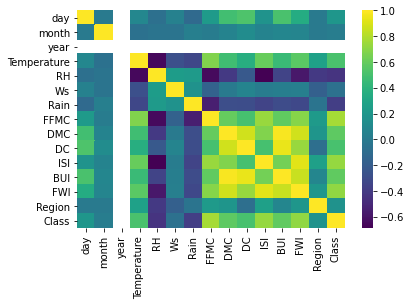

In [46]:
sns.heatmap(df.corr(), cmap='viridis')

> <b> Boxplot for finding outliers </b>

<AxesSubplot:>

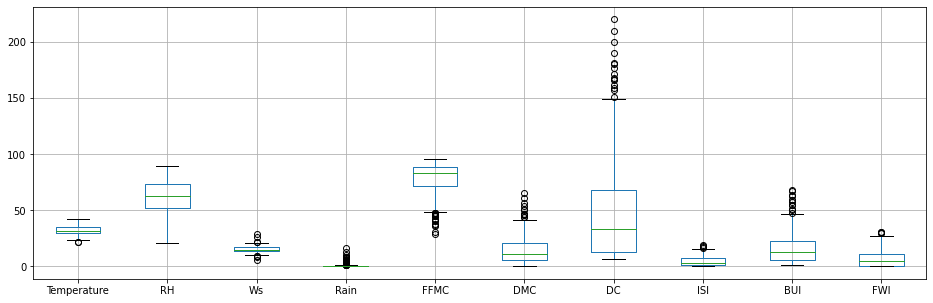

In [106]:
df.boxplot(['Temperature','RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI'],figsize=(16,5))

In [116]:
df1 = df[df.columns[3:-4]]
scaler = StandardScaler()
scaler.fit(df1)
scaled_df = scaler.transform(df1)
scaled_df

array([[-0.87473544, -0.33247844,  0.88999047, ..., -0.83447856,
        -0.93655635, -0.88345707],
       [-0.87473544, -0.0631847 , -0.89291326, ..., -0.90683562,
        -0.9012768 , -0.89694665],
       [-1.70200461,  1.35060746,  2.31631345, ..., -1.07566876,
        -0.98594772, -0.9374154 ],
       ...,
       [-1.42624822,  1.68722464,  4.81237868, ..., -1.05154974,
        -0.93655635, -0.92392582],
       [-2.25351739, -0.53444875,  0.88999047, ..., -0.73800248,
        -0.81660589, -0.85647791],
       [-2.25351739,  0.13878561, -0.17975177, ..., -0.85859758,
        -0.83777362, -0.88345707]])

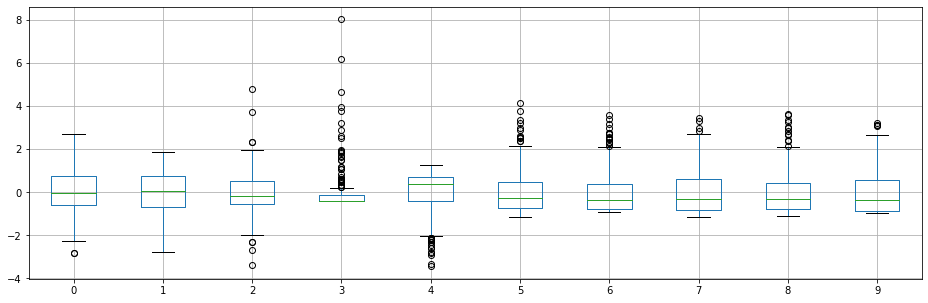

In [117]:
fig = plt.figure(figsize =(16, 5))
scaled_df=pd.DataFrame(scaled_df)
scaled_df.boxplot()
plt.show()

> 0 : 'Temperature' , 1 : 'RH' , 2 : 'Ws' , 3 : 'Rain' , 4 : 'FFMC' , 5 : 'DMC' , 6 : 'DC' , 7 : 'ISI' , 8 : 'BUI' , 9 : 'FWI'

> <b> Plot graph between Fire Vs Not fire </b>

<AxesSubplot:title={'center':'Fire Vs Not fire'}>

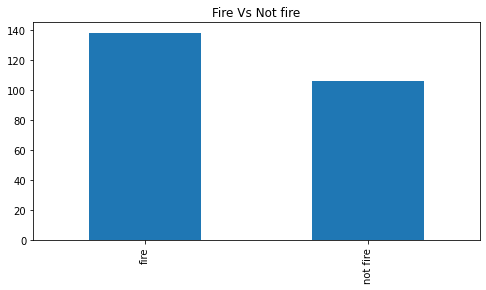

In [122]:
df['Classes'].value_counts().plot(kind='bar', title='Fire Vs Not fire', figsize=(8,4))

In [129]:
from scipy import stats
def qqplot(x, y, **kwargs):
    _, xr = stats.probplot(x, fit=False)
    _, yr = stats.probplot(y, fit=False)
    plt.scatter(xr, yr, **kwargs)

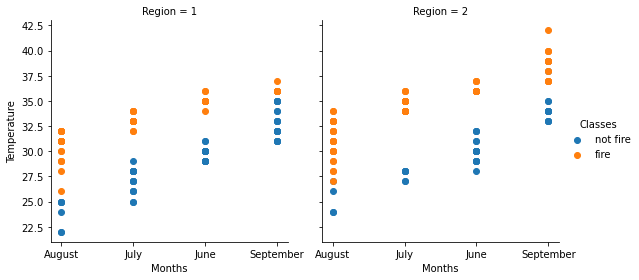

In [130]:
g = sns.FacetGrid(df, hue="Classes", col="Region", height=4)
g.map(qqplot, "Months", "Temperature")
g.add_legend()

In [121]:
df_Bejaia = df[df['Region'] ==1]
df_SidiBel = df[df['Region'] ==2]

<AxesSubplot:title={'center':'Fire Vs Not fire'}>

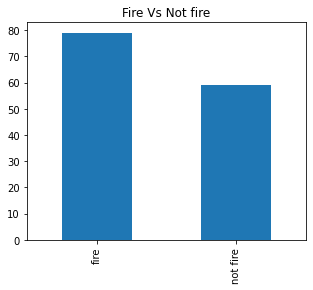

In [124]:
#plot_data = df_Bejaia['Classes'].value_counts().plot(kind='bar', title='Fire Vs Not fire', figsize=(5,4))
plot_data = df_Bejaia['Classes'].value_counts()
plt.figure(figsize=(5,4))
plt.ylim(100,500)
sns.barplot(data=plot_data, x='brand', y='count')
#df_SidiBel['Classes'].value_counts().plot(kind='bar', title='Fire Vs Not fire', figsize=(5,4))

> <b> Analysing data with histogram</b>

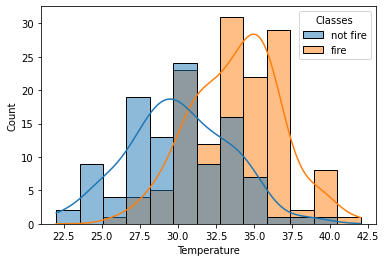

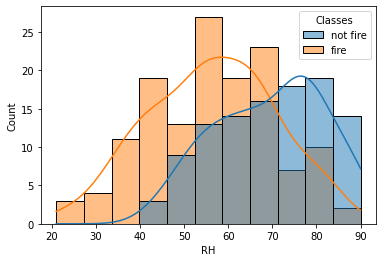

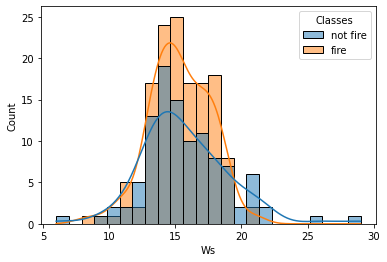

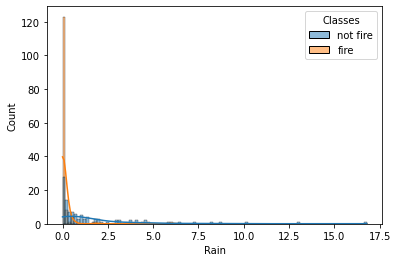

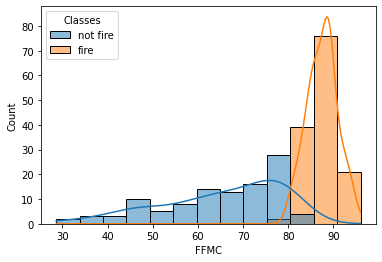

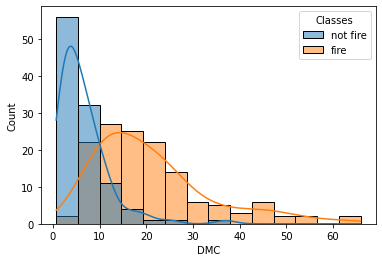

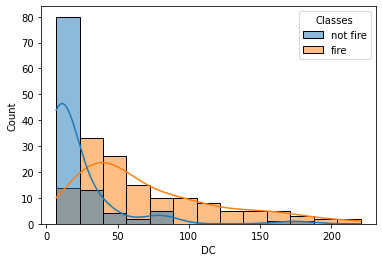

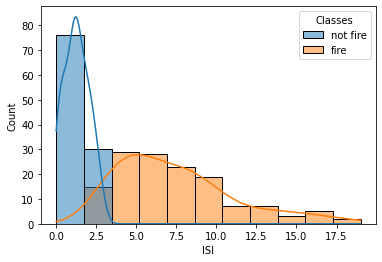

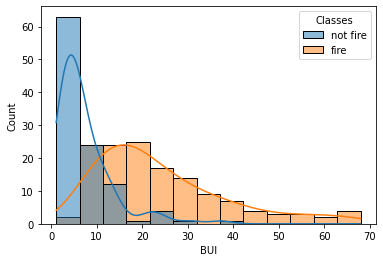

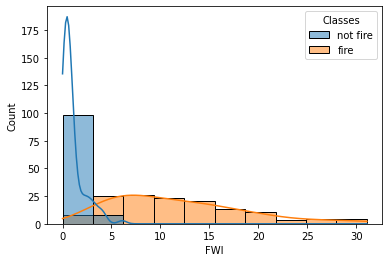

In [104]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 200em; }</style>"))

for feature in df.columns[3:-4]:
    sns.histplot(data = df , x = df[feature],hue = 'Classes', kde = True)
    plt.show()

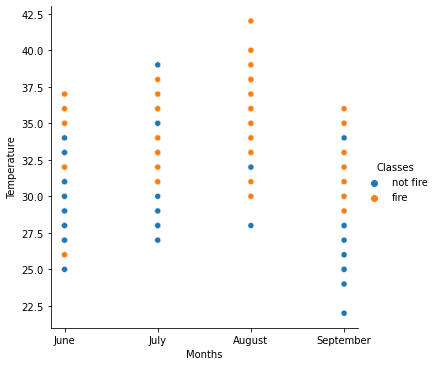

In [92]:
#df['Months'].value_counts().plot(kind='bar', title='Months',figsize=(8,5))
#df.boxplot(['RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI'],figsize=(16,5))
#sns.relplot(x='Months',y = 'Rain',hue='Classes', data=df)
#plt.show()
#df.boxplot(['DC'])
#plt.subplot(121)
sns.relplot(x='Months',y = 'Temperature',hue='Classes', data=df)
#sns.distplot(df['RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI'])

<AxesSubplot:>

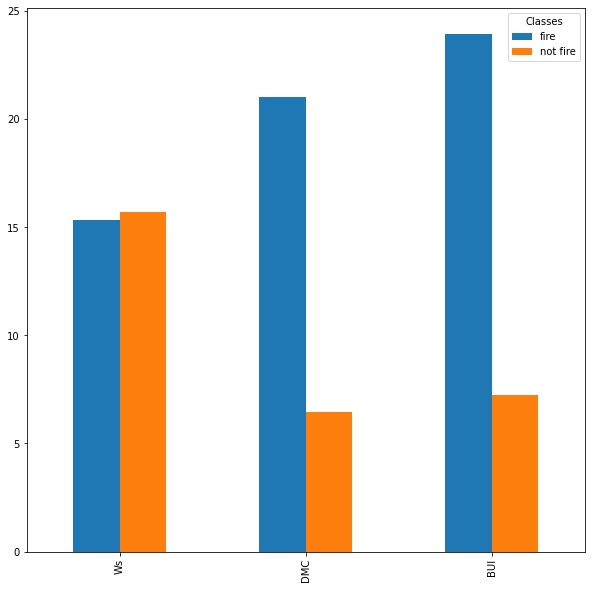

In [83]:
df.groupby('Classes')[['Ws', 'DMC','BUI']].mean().T.plot(kind='bar', figsize=(10,10))

In [132]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [133]:
profile.to_file("profiling_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Logistic Regression

> <b> Split the data</b>

In [247]:
#X = df.iloc[:,:-4]
X = df[['day','month','Temperature','RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI','Region']]
Y = df.iloc[:,-1]

In [248]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

> <b> Logistic Regression</b>

In [249]:
regression = LogisticRegression()

In [250]:
from sklearn.model_selection import GridSearchCV

parameters = {'C': [0.5,1,2,3,5,6,7,9,10,30,45], 'penalty': ['l1','l2','elasticnet']}
log_regressor = GridSearchCV(regression,parameters, scoring = 'accuracy', cv = 5)
log_regressor.fit(X,Y)


C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_v

C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got elasticnet penalty.

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_sele

C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linea

C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\Users\athir\anaconda3\lib\site-packages\sklearn\model_selection\_v

C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\athir\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.5, 1, 2, 3, 5, 6, 7, 9, 10, 30, 45],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='accuracy')

In [251]:
print(log_regressor.best_params_)

{'C': 0.5, 'penalty': 'l2'}


In [252]:
print(log_regressor.best_score_)

0.9631802721088436


In [253]:
prediction_log = log_regressor.predict(X_test)

In [254]:
from sklearn.metrics import accuracy_score,confusion_matrix,precision_recall_curve,roc_auc_score,f1_score

In [255]:
confusion_matrix(y_test,prediction_log)

array([[28,  0],
       [ 0, 53]], dtype=int64)

In [256]:
f1_score(y_test,prediction_log)

1.0

In [257]:
print(classification_report(y_test,prediction_log))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        53

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



## KNN

> <b>Standardize the Variables</b><br>
Because the KNN classifier predicts the class of a given test observation by identifying the observations that are nearest to it, the scale of the variables matters. Any variables that are on a large scale will have a much larger effect on the distance between the observations, and hence on the KNN classifier, than variables that are on a small scale.

In [258]:
df1 = df[['day','month','Temperature','RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI','Region']]
scaler = StandardScaler()
scaler.fit(df1)
scaled_df = scaler.transform(df1)
scaled_df

array([[-1.67527776, -1.35052592, -0.87473544, ..., -0.93655635,
        -0.88345707, -1.        ],
       [-1.56173115, -1.35052592, -0.87473544, ..., -0.9012768 ,
        -0.89694665, -1.        ],
       [-1.44818455, -1.35052592, -1.70200461, ..., -0.98594772,
        -0.9374154 , -1.        ],
       ...,
       [ 1.39048054,  1.35052592, -1.42624822, ..., -0.93655635,
        -0.92392582,  1.        ],
       [ 1.50402714,  1.35052592, -2.25351739, ..., -0.81660589,
        -0.85647791,  1.        ],
       [ 1.61757374,  1.35052592, -2.25351739, ..., -0.83777362,
        -0.88345707,  1.        ]])

In [259]:
df_feat = pd.DataFrame(scaled_df,columns=['day','month','Temperature','RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI','Region'])
df_feat.head()

,day,month,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Region
0,-1.675278,-1.350526,-0.874735,-0.332478,0.889990,-0.381223,-0.851801,-0.913365,-0.877239,-0.834479,-0.936556,-0.883457,-1.0
1,-1.561731,-1.350526,-0.874735,-0.063185,-0.892913,0.270307,-0.942658,-0.856651,-0.877239,-0.906836,-0.901277,-0.896947,-1.0
2,-1.448185,-1.350526,-1.702005,1.350607,2.316313,6.184192,-2.151758,-0.986283,-0.887760,-1.075669,-0.985948,-0.937415,-1.0
3,-1.334638,-1.350526,-1.977761,1.821872,-0.892913,0.871719,-3.444727,-1.083506,-0.891969,-1.148026,-1.056507,-0.950905,-1.0
4,-1.221091,-1.350526,-1.426248,1.013990,0.176829,-0.381223,-0.914702,-0.945773,-0.738355,-0.858598,-0.901277,-0.883457,-1.0


C:\Users\athir\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\athir\anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


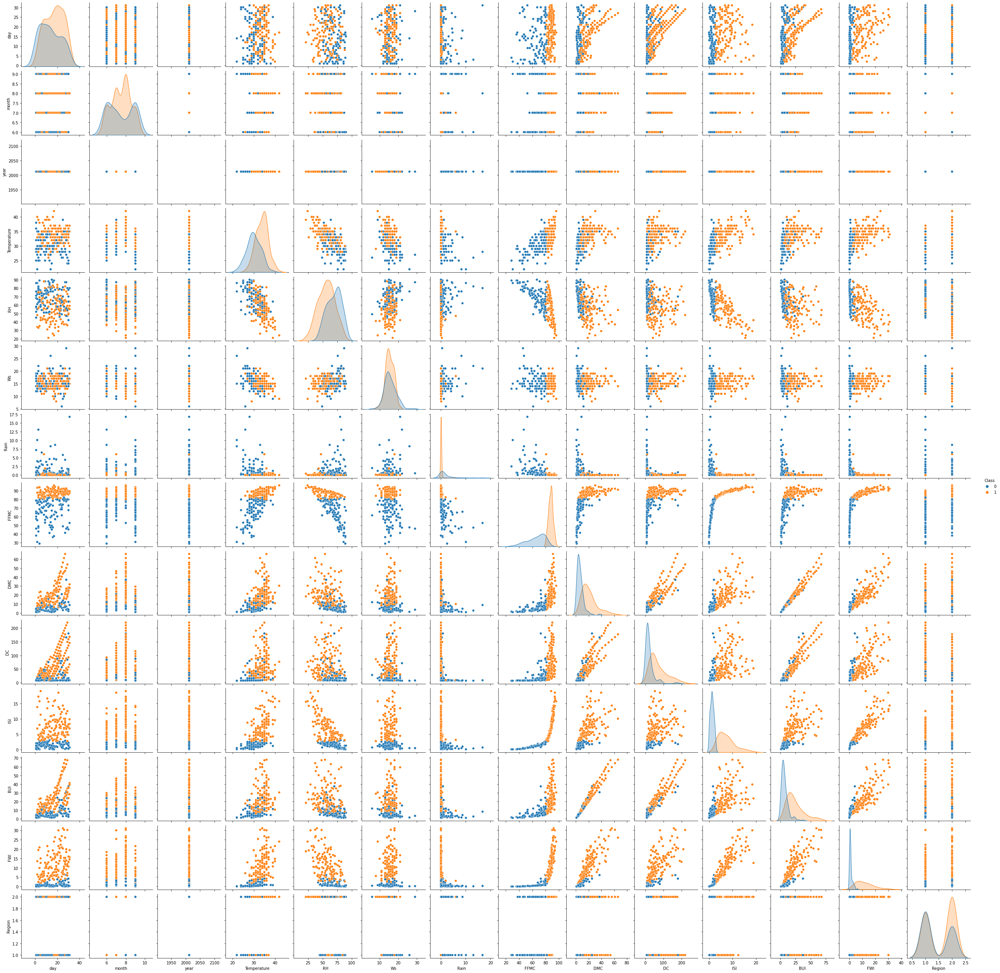

In [178]:
sns.pairplot(df,hue = 'Class')


In [273]:
X_train, X_test, y_train, y_test = train_test_split(scaled_df, df['Class'], test_size=0.33, random_state=42)

In [274]:
knn = KNeighborsClassifier(n_neighbors=1)

In [275]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [277]:
knn_pred = knn.predict(X_test)

In [278]:
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import cross_val_score

In [279]:
print(confusion_matrix(y_test,knn_pred))

[[25  3]
 [ 8 45]]


In [280]:
print(classification_report(y_test,knn_pred))

              precision    recall  f1-score   support

           0       0.76      0.89      0.82        28
           1       0.94      0.85      0.89        53

    accuracy                           0.86        81
   macro avg       0.85      0.87      0.86        81
weighted avg       0.88      0.86      0.87        81



> Choose K value

In [281]:
accuracy_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,df_feat,df['Class'],cv=10)
    accuracy_rate.append(score.mean())

In [282]:
error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    score=cross_val_score(knn,df_feat,df['Class'],cv=10)
    error_rate.append(1-score.mean())

In [283]:
error_rate = []

# Will take some time
for i in range(1,40):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

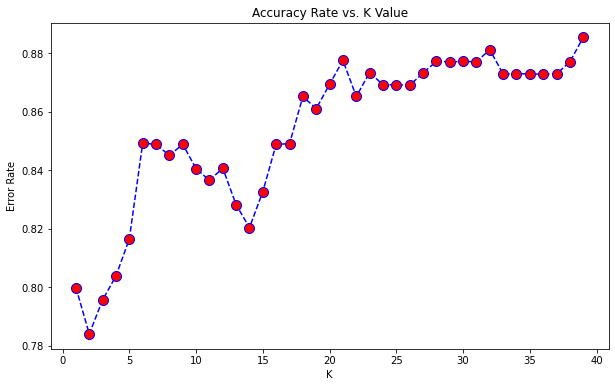

In [284]:
plt.figure(figsize=(10,6))
#plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
 #        markerfacecolor='red', markersize=10)
plt.plot(range(1,40),accuracy_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Accuracy Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Text(0, 0.5, 'Error Rate')

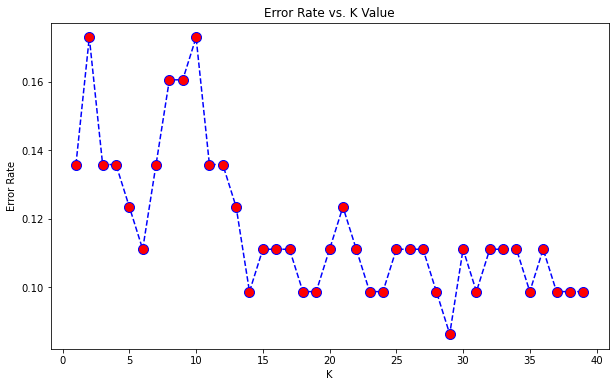

In [187]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

Here we can see that that after K>14 the error rate is stable. Let's retrain the model with that and check the classification report!

In [285]:
# FIRST A QUICK COMPARISON TO OUR ORIGINAL K=1
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_train,y_train)
pred_knn = knn.predict(X_test)

print('WITH K=1')
print('\n')
print(confusion_matrix(y_test,pred_knn))
print('\n')
print(classification_report(y_test,pred_knn))

WITH K=1


[[25  3]
 [ 8 45]]


              precision    recall  f1-score   support

           0       0.76      0.89      0.82        28
           1       0.94      0.85      0.89        53

    accuracy                           0.86        81
   macro avg       0.85      0.87      0.86        81
weighted avg       0.88      0.86      0.87        81



In [286]:
# FIRST A QUICK COMPARISON TO OUR ORIGINAL K=29
knn = KNeighborsClassifier(n_neighbors=29)

knn.fit(X_train,y_train)
predict_knn = knn.predict(X_test)

print('WITH K=29')
print('\n')
print(confusion_matrix(y_test,predict_knn))
print('\n')
print(classification_report(y_test,predict_knn))

WITH K=29


[[27  1]
 [ 6 47]]


              precision    recall  f1-score   support

           0       0.82      0.96      0.89        28
           1       0.98      0.89      0.93        53

    accuracy                           0.91        81
   macro avg       0.90      0.93      0.91        81
weighted avg       0.92      0.91      0.91        81



> <b> Decision Tree</b>

In [287]:
classifier= DecisionTreeClassifier(criterion= 'entropy')


In [288]:
X = df[['day','month','Temperature','RH','Ws','Rain','FFMC','DMC','DC','ISI','BUI','FWI','Region']]
Y = df.iloc[:,-1]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [289]:
decision_tree = classifier.fit(X,Y)

In [290]:
tree_para = {'criterion':['gini','entropy'],'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]}
clf = GridSearchCV(DecisionTreeClassifier(), tree_para, cv=5)
clf.fit(X, Y)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 20, 30,
                                       40, 50, 70, 90, 120, 150]})

In [291]:
print(clf.best_params_)



{'criterion': 'gini', 'max_depth': 30}


In [292]:
print(clf.best_score_)

0.9795068027210885


[Text(418.5, 498.3, 'X[6] <= 80.15\nentropy = 0.988\nsamples = 244\nvalue = [106, 138]'),
 Text(279.0, 407.70000000000005, 'entropy = 0.0\nsamples = 102\nvalue = [102, 0]'),
 Text(558.0, 407.70000000000005, 'X[6] <= 82.1\nentropy = 0.185\nsamples = 142\nvalue = [4, 138]'),
 Text(418.5, 317.1, 'X[4] <= 15.5\nentropy = 0.946\nsamples = 11\nvalue = [4, 7]'),
 Text(279.0, 226.5, 'X[0] <= 16.5\nentropy = 0.918\nsamples = 6\nvalue = [4, 2]'),
 Text(139.5, 135.89999999999998, 'entropy = 0.0\nsamples = 3\nvalue = [3, 0]'),
 Text(418.5, 135.89999999999998, 'X[10] <= 7.3\nentropy = 0.918\nsamples = 3\nvalue = [1, 2]'),
 Text(279.0, 45.299999999999955, 'entropy = 0.0\nsamples = 1\nvalue = [1, 0]'),
 Text(558.0, 45.299999999999955, 'entropy = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(558.0, 226.5, 'entropy = 0.0\nsamples = 5\nvalue = [0, 5]'),
 Text(697.5, 317.1, 'entropy = 0.0\nsamples = 131\nvalue = [0, 131]')]

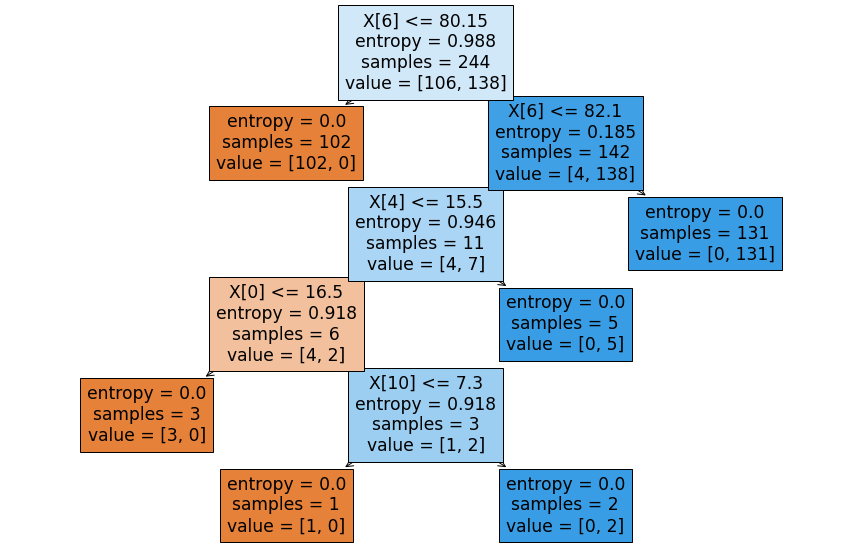

In [229]:
plt.figure(figsize=(15,10))
tree.plot_tree(classifier,filled=True)

In [293]:
prediction_decision = clf.predict(X_test)

In [294]:
print(confusion_matrix(y_test,prediction_decision))

[[28  0]
 [ 0 53]]


In [295]:
print(f1_score(y_test,prediction_decision))

1.0


In [296]:

print(classification_report(y_test, prediction_decision))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        53

    accuracy                           1.00        81
   macro avg       1.00      1.00      1.00        81
weighted avg       1.00      1.00      1.00        81



><b> SVM</b>

In [297]:
## Split the dataset into train and test

X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=0)

In [298]:

classifier=SVC(kernel="rbf")
classifier.fit(X_train,y_train)

SVC()

In [299]:

y_pred = classifier.predict(X_test)
accuracy_score(y_test, y_pred)

0.9344262295081968

In [300]:
classifier = SVC(kernel="linear")
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
accuracy_score(y_test, y_pred)

0.9508196721311475

In [301]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.96      0.95        28
           1       0.97      0.94      0.95        33

    accuracy                           0.95        61
   macro avg       0.95      0.95      0.95        61
weighted avg       0.95      0.95      0.95        61



><b> AdaBoost</b>

In [303]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_classification

In [305]:
ada = AdaBoostClassifier(n_estimators=100, random_state=0)
ada.fit(X, Y)

AdaBoostClassifier(n_estimators=100, random_state=0)

In [308]:
ada_predict = ada.predict([[0, 0, 0, 0,0,0,0,0,0,0,0,0,0]])

In [309]:
ada_predict = ada.predict(X_test)

In [310]:
ada.score(X, Y)

1.0

In [311]:
print(classification_report(y_test, ada_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        28
           1       1.00      1.00      1.00        33

    accuracy                           1.00        61
   macro avg       1.00      1.00      1.00        61
weighted avg       1.00      1.00      1.00        61



## CONCLUSION

|Models|Logistic Regreesion | KNN | Decision Tree| SVM | AdaBoost |
|:-:|:-:|:-:|:-:|:-:|:-:|
|Accuarcy| 100% | 91% | 100% | 95% | 100% |

## PREDICTION

In [313]:
import pickle
pickle.dump(classifier,open('model.pkl','wb'))

In [314]:
pickle_model = pickle.load(open('model.pkl','rb'))
pickle_model.predict(X_test)

array([1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0])

In [323]:
# single_input
dict_test = {
    "day" : 21,
    "month" : 6,
    "temperature" : 41,
    "RH" : 77,
    'Ws' : 16,
    'Rain' : 0,
    'FFMC' : 64.8,
    'DMC' : 3,
    'DC' : 14.2,
    'ISI' : 1.2,
    'BUI' : 3.9,
    'FWI' :  0.5,
    'Region' :2
}

In [327]:
if pickle_model.predict([list(dict_test.values())])[0] == 0:
    print('No Fire')
else:
    print("Fire")

No Fire
